In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

        
# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/razor-sample-data/Razor_sample.csv


In [2]:
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import RandomizedSearchCV
from sklearn.preprocessing import MinMaxScaler,StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn import metrics
from xgboost import XGBRegressor


In [3]:

data= pd.read_csv("../input/razor-sample-data/Razor_sample.csv")

In [4]:
print(data)

     Date Added category   sellerlink    sellerlink-url  \
0     15-Nov-20   Garden     Seller 1     Seller 1-link   
1     15-Nov-20   Garden     Seller 2     Seller 2-link   
2     15-Nov-20   Garden     Seller 3     Seller 3-link   
3     15-Nov-20   Garden     Seller 4     Seller 4-link   
4     15-Nov-20   Garden     Seller 5     Seller 5-link   
...         ...      ...          ...               ...   
1834  15-Nov-20   Garden  Seller 1835  Seller 1835-link   
1835  15-Nov-20   Garden  Seller 1836  Seller 1836-link   
1836  15-Nov-20   Garden  Seller 1837  Seller 1837-link   
1837  15-Nov-20   Garden  Seller 1838  Seller 1838-link   
1838  15-Nov-20   Garden  Seller 1839  Seller 1839-link   

            sellerstorefront-url            sellerproductcount  \
0        Seller 1-storefrontlink  1-16 of over 100,000 results   
1        Seller 2-storefrontlink                           NaN   
2        Seller 3-storefrontlink    1-16 of over 2,000 results   
3        Seller 4-storefron

In [5]:
data.head
import pandas_profiling


In [6]:
#INITIALLY DROPPING THE FEATURES WHICH LOGICALLY I DONT FIND RELEVENT IN TERMS OF DETERMINING THE BEST SELLER.
#SO WE USE DROP FN TO GET RID OF THOSE COLUMNS FROM OUR DATASET.

data = data.drop(['Date Added', 'category','sellerlink', 'sellerlink-url', 'sellerstorefront-url', 'sellerdetails','seller business name', 'businessaddress','Sample Brand URL','Unnamed: 18','Unnamed: 19', 'Unnamed: 20',"Sample brand name"], axis=1)

In [7]:
#NOW AFTER GETTING RID OF THE USELESS FEATURES, I WANT TO GET AN DETAILED OVERALL ANALYSIS OF THESE FEATURES AND 
#THEIR CORRELATION TO EACH OTHER.
#SO FOR THAT TO AVOID THE MANUAL LABOUR, I USE PROFILE REPORT FUNCTION OF PANDAS, WHICH GIVES ME A DETAILED ANALYSIS.
data.profile_report()


Summarize dataset:   0%|          | 0/22 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [8]:
#Since AFTER ANALYSING THE DATA, I saw there were many sellers with incomplete info(features) we drop those sellers from out data.
#It is important so that it doesnt complicate our process.

data=data.dropna()

In [9]:
#ALSO WE CAN SEE THAT BY ANALYSING THE VARIOUS COEFFICIENT MATRIX WHICH TELLS US ABOUT HOW CLOSELY OUR FEATURES ARE
#INTERRELATED TO EACH OTHER. WE CAN SEE hero product 1 and 2 ARE HIGHLY CORRELATED WITH INDEX OF MORE THAN 0.7.
#SINCE hero product 1 and 2 are highly correlated we drop one of them. So logically I dropped hero product 2, Since hero
#product 1 is more important determining factor.


data = data.drop(['Hero Product 2 #ratings'],axis =1)
print(data)



                sellerproductcount  \
0     1-16 of over 100,000 results   
2       1-16 of over 2,000 results   
4       1-16 of over 1,000 results   
8              1-16 of 133 results   
10      1-16 of over 4,000 results   
...                            ...   
1833   1-16 of over 10,000 results   
1834    1-16 of over 2,000 results   
1836   1-16 of over 10,000 results   
1837           1-16 of 473 results   
1838   1-16 of over 20,000 results   

                                         sellerratings  \
0     88% positive in the last 12 months (118 ratings)   
2      85% positive in the last 12 months (75 ratings)   
4      81% positive in the last 12 months (52 ratings)   
8             100% positive lifetime (4 total ratings)   
10            100% positive lifetime (3 total ratings)   
...                                                ...   
1833          87% positive lifetime (15 total ratings)   
1834   83% positive in the last 12 months (46 ratings)   
1836            0% po

In [10]:
#SINCE THE "sellerproductcount" IS IN STRING FORMAT WE EXTRACT THE NUMBERS WHICH I THINK WILL BE USEFUL, WHICH
# IS BASICALLY THE COUNT OF PRODUCT.



In [11]:
def get_product_cnt(string):
    li = string.split(' ')
    s = li[-2]
    l1 = s.split(',')
    t=""
    for x in l1:
        t = t+ x
    
    return int(t)
print(data['sellerproductcount'])

0       1-16 of over 100,000 results
2         1-16 of over 2,000 results
4         1-16 of over 1,000 results
8                1-16 of 133 results
10        1-16 of over 4,000 results
                    ...             
1833     1-16 of over 10,000 results
1834      1-16 of over 2,000 results
1836     1-16 of over 10,000 results
1837             1-16 of 473 results
1838     1-16 of over 20,000 results
Name: sellerproductcount, Length: 1198, dtype: object


In [12]:
data['sellerproductcount'] = data['sellerproductcount'].apply(get_product_cnt)



In [13]:
print(data['sellerproductcount'])

0       100000
2         2000
4         1000
8          133
10        4000
         ...  
1833     10000
1834      2000
1836     10000
1837       473
1838     20000
Name: sellerproductcount, Length: 1198, dtype: int64


In [14]:
# SINCE THE "SELLERRATING FEATURE" IS IN STRING FORMAT WE EXTRACT THE NUMBERS WHICH I THINK WILL BE USEFUL 
# SO BASICALLY ONLY EXTRACTING THE COUNT OF POSITIVE RATING AND % OF POSITIVE RATING.


In [15]:
# FUNCTION FOR % OF POSITIVE RATING.

def get_percent(string):
    li = string.split('%')
    s = li[0]    
    return int(s)
li = []
l2 = data['sellerratings']
print(l2)

0       88% positive in the last 12 months (118 ratings)
2        85% positive in the last 12 months (75 ratings)
4        81% positive in the last 12 months (52 ratings)
8               100% positive lifetime (4 total ratings)
10              100% positive lifetime (3 total ratings)
                              ...                       
1833            87% positive lifetime (15 total ratings)
1834     83% positive in the last 12 months (46 ratings)
1836              0% positive lifetime (1 total ratings)
1837             67% positive lifetime (3 total ratings)
1838            100% positive lifetime (2 total ratings)
Name: sellerratings, Length: 1198, dtype: object


In [16]:

data['sellerratings'] = data['sellerratings'].apply(get_percent)
data['sellerratings']

0        88
2        85
4        81
8       100
10      100
       ... 
1833     87
1834     83
1836      0
1837     67
1838    100
Name: sellerratings, Length: 1198, dtype: int64

In [17]:
# FUNCTION FOR  COUNT OF POSITIVE RATING.

def get_rating(string):
    l1 = string.split(' ')
    s = l1[-2]
    if(s == "total"):
        s = l1[-3]
        
    t = s[1:]
    return int(t)

print(l2)
data

0       88% positive in the last 12 months (118 ratings)
2        85% positive in the last 12 months (75 ratings)
4        81% positive in the last 12 months (52 ratings)
8               100% positive lifetime (4 total ratings)
10              100% positive lifetime (3 total ratings)
                              ...                       
1833            87% positive lifetime (15 total ratings)
1834     83% positive in the last 12 months (46 ratings)
1836              0% positive lifetime (1 total ratings)
1837             67% positive lifetime (3 total ratings)
1838            100% positive lifetime (2 total ratings)
Name: sellerratings, Length: 1198, dtype: object


,sellerproductcount,sellerratings,Count of seller brands,Max % of negative seller ratings - last 30 days,Max % of negative seller ratings - last 90 days,Max % of negative seller ratings - last 12 months,Hero Product 1 #ratings
0,100000,88,16,17,11,12,5873
2,2000,85,15,0,25,12,164
4,1000,81,16,0,31,15,224
8,133,100,1,0,0,0,65
10,4000,100,15,0,0,0,2
...,...,...,...,...,...,...,...
1833,10000,87,1,0,0,0,8
1834,2000,83,5,0,9,15,95
1836,10000,0,10,0,0,0,1
1837,473,67,4,0,0,33,9


In [18]:
l2 = l2.apply(get_rating)
print(l2)
data.rename(columns = {"sellerratings":"% of +ve ratings"},inplace=True)

0       118
2        75
4        52
8         4
10        3
       ... 
1833     15
1834     46
1836      1
1837      3
1838      2
Name: sellerratings, Length: 1198, dtype: int64


In [19]:
#ALSO WE NEED TO ADD A NEW FEATURE SINCE "SELLERRATING FEATURE" GIVES US TWO SEPERATE FEATURE AS WE CAN SEE ABOVE.

data = (pd.concat([data,l2],axis=1))

In [20]:
# NOW WE GET OUR FINAL FEATURES WHICH IS IMPORTANT FOR OUR PROCESS.
data

,sellerproductcount,% of +ve ratings,Count of seller brands,Max % of negative seller ratings - last 30 days,Max % of negative seller ratings - last 90 days,Max % of negative seller ratings - last 12 months,Hero Product 1 #ratings,sellerratings
0,100000,88,16,17,11,12,5873,118
2,2000,85,15,0,25,12,164,75
4,1000,81,16,0,31,15,224,52
8,133,100,1,0,0,0,65,4
10,4000,100,15,0,0,0,2,3
...,...,...,...,...,...,...,...,...
1833,10000,87,1,0,0,0,8,15
1834,2000,83,5,0,9,15,95,46
1836,10000,0,10,0,0,0,1,1
1837,473,67,4,0,0,33,9,3


In [21]:

data.profile_report()


Summarize dataset:   0%|          | 0/23 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [22]:
# SINCE TO AVOID MANUAL SELECTION, I DECIDED WE CAN DO K-MEANS CLUSTERING (UNSUPERVISED LEARNING) TO GET THE
# REQUIRED GROUP OF BEST SELLERS SINCE THEY WILL POSSESS SIMILAR ATTRIBUTES.


In [23]:
#BEFORE K MEANS WE APPLY PCA FOR EASY DATA VISUALISATION AND WHICH REDUCES THE NOISY DATASET AND IMPROVE THE ACCURACY
#OF THE CLUSTERING PROCESS. 
#IT IS IMPORTANT TO SCALE THE DATASET BEFORE PCA.

from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
scalar = StandardScaler()
  
# fitting
scalar.fit(data)
scaled_data = scalar.transform(data)
  
# Importing PCA
from sklearn.decomposition import PCA
  
# Let's say, components = 2
pca = PCA(n_components = 2)
pca.fit(scaled_data)
x_pca = pca.transform(scaled_data)
  
print(x_pca.shape)
x_pca

(1198, 2)


array([[ 0.06704717,  3.45692642],
       [ 0.0115636 ,  0.09402052],
       [ 0.2816474 ,  0.15593209],
       ...,
       [ 0.92423831, -0.35394524],
       [ 0.33101283, -0.9812472 ],
       [-0.93091204, -0.63724969]])

Text(0, 0.5, 'Second Principal Component')

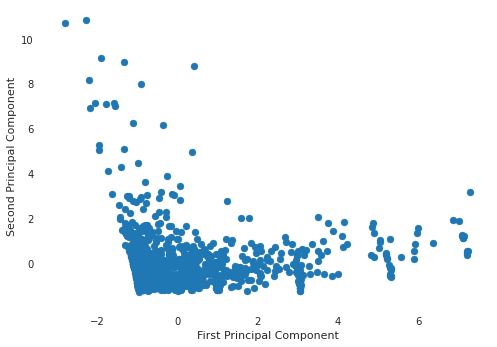

In [24]:
# PLOTTING THE GRAPH
  
plt.scatter(x_pca[:, 0], x_pca[:, 1], cmap ='plasma')
  
# labeling x and y axes
plt.xlabel('First Principal Component')
plt.ylabel('Second Principal Component')

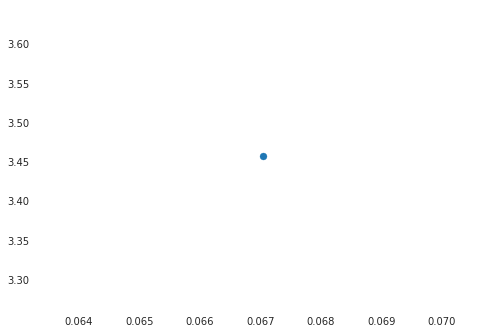

In [25]:
plt.scatter(x_pca[0, 0], x_pca[0, 1], cmap ='plasma')

[2 0 0 ... 0 0 0]
      0
0     2
1     0
2     0
3     0
4     0
...  ..
1193  0
1194  0
1195  0
1196  0
1197  0

[1198 rows x 1 columns]


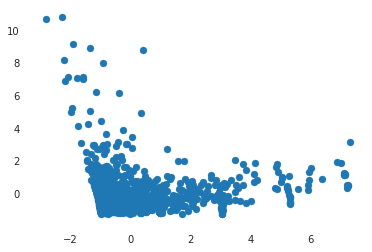

In [26]:
# APPLYING KMEANS CLUSTERING METHOD

from sklearn.cluster import KMeans
%matplotlib inline
Kmean = KMeans(n_clusters=3)
Kmean.fit(x_pca)
Kmean.cluster_centers_
plt.scatter(x_pca[ : ,0], x_pca[ : , 1])

k1 = Kmean.labels_

print(k1)
df = pd.DataFrame(k1)
print(df)

In [27]:
k1
# SINCE WE CAN OBSERVE THAT OUR SELLER AT THE 0TH INDEX FROM OUR DATA, WE CAN CONCLUDE THAT OUR 1ST SELLER
# MUST BE ONE OF THE BEST SELLERS AMONG THE WHOLE DATASET. 
# SO THE GROUP IN WHICH THAT SELLER WILL BELONG WILL BE ONE OF THE BEST SELLERS.


array([2, 0, 0, ..., 0, 0, 0], dtype=int32)

In [28]:
data


,sellerproductcount,% of +ve ratings,Count of seller brands,Max % of negative seller ratings - last 30 days,Max % of negative seller ratings - last 90 days,Max % of negative seller ratings - last 12 months,Hero Product 1 #ratings,sellerratings
0,100000,88,16,17,11,12,5873,118
2,2000,85,15,0,25,12,164,75
4,1000,81,16,0,31,15,224,52
8,133,100,1,0,0,0,65,4
10,4000,100,15,0,0,0,2,3
...,...,...,...,...,...,...,...,...
1833,10000,87,1,0,0,0,8,15
1834,2000,83,5,0,9,15,95,46
1836,10000,0,10,0,0,0,1,1
1837,473,67,4,0,0,33,9,3


In [29]:
# SO WE CAN SEE THE SELLER IN OUR 0TH INDEX BELONGS TO GROUP 2, SO OUR DESIRED GROUP WILL BE GROUP 2.
# SO WE EXTRACT ALL THE SELLERS IN OUR GROUP 2 AND PUT IT IN A LIST.

In [30]:
df.value_counts()
# WE CAN SEE OUR DESIRED GROUP HAS 43 SELLERS.

0    1003
1     152
2      43
dtype: int64

In [31]:
print(data.index)
print(k1[0])

Int64Index([   0,    2,    4,    8,   10,   11,   12,   14,   16,   18,
            ...
            1823, 1825, 1827, 1830, 1831, 1833, 1834, 1836, 1837, 1838],
           dtype='int64', length=1198)
2


In [32]:
Final_sellers = []
cnt = 0
for index1 in data.index :
    if(k1[cnt]==2):
        Final_sellers.append("seller " +str(index1+1))
    cnt=cnt+1
    

In [33]:
#final best sellers list
Final_sellers

['seller 1',
 'seller 24',
 'seller 27',
 'seller 32',
 'seller 34',
 'seller 37',
 'seller 38',
 'seller 54',
 'seller 101',
 'seller 108',
 'seller 140',
 'seller 186',
 'seller 207',
 'seller 322',
 'seller 323',
 'seller 387',
 'seller 435',
 'seller 446',
 'seller 470',
 'seller 475',
 'seller 496',
 'seller 572',
 'seller 657',
 'seller 700',
 'seller 713',
 'seller 727',
 'seller 744',
 'seller 820',
 'seller 830',
 'seller 833',
 'seller 838',
 'seller 843',
 'seller 883',
 'seller 916',
 'seller 948',
 'seller 986',
 'seller 1008',
 'seller 1046',
 'seller 1047',
 'seller 1059',
 'seller 1496',
 'seller 1785',
 'seller 1815']

In [34]:
len(Final_sellers)

43